#Подключение библиотек

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *

import torch
print('pytorch version: ',torch.__version__)
import fastai
print('fastai version: ',fastai.__version__)

%reload_ext autoreload
%autoreload 2
%matplotlib inline

pytorch version:  1.5.0+cu101
fastai version:  1.0.61


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


#Загрузка и отображение данных

Classes: 
 ['Акне', 'Витилиго', 'Герпес', 'Дерматит', 'Лишай', 'Невус', 'Псориаз', 'Сыпь', 'Хлоазма', 'Экзема']


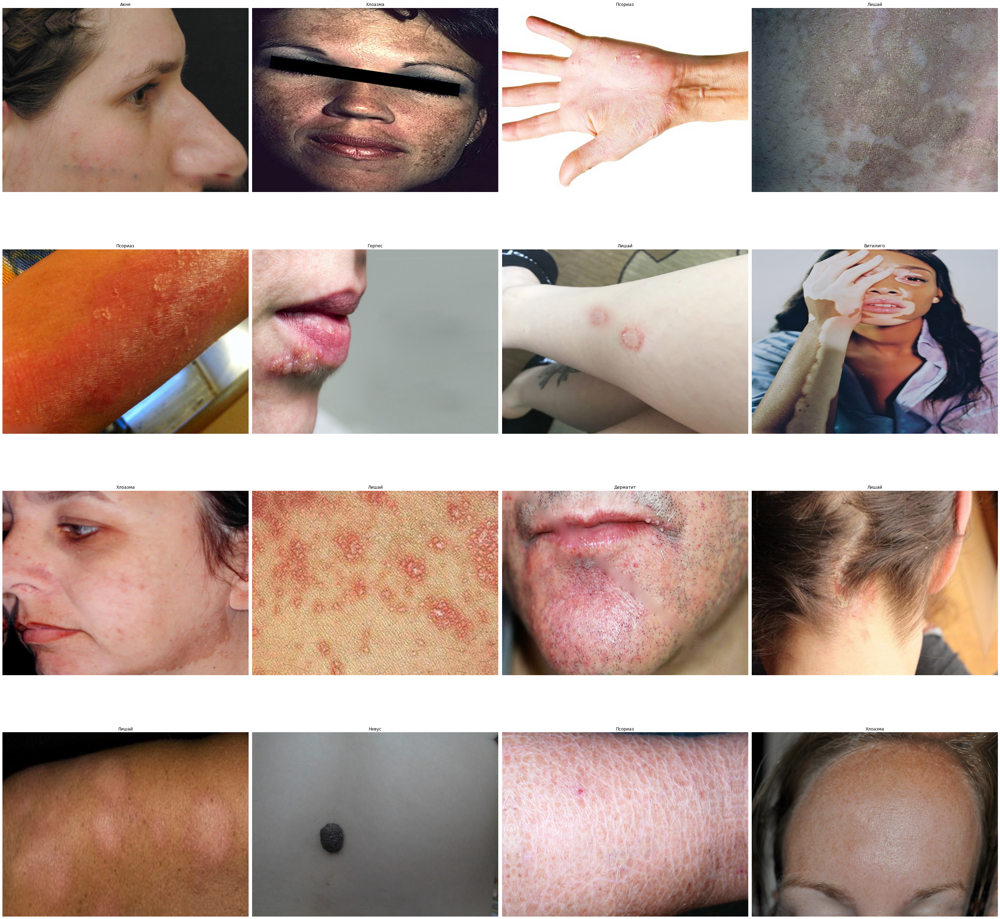

In [3]:
path=Path('/content/drive/My Drive/NN/стажировка/Prj2_Skin/Untitled Folder/origin/')
data = ImageDataBunch.from_folder(path, train='',
                                  valid_pct=0.2,
                                  ds_tfms=get_transforms(do_flip=True, flip_vert=False, max_rotate = 10.0, max_lighting=0.3, max_zoom = 1.1, max_warp=0.2),
                                  size=(768,1024),bs=16,num_workers=0).normalize(imagenet_stats)
print(f'Classes: \n {data.classes}')
data.show_batch(rows=5, figsize=(40,40))

#Экспреименты с сетью

##ResNet152 (fast.ai)

###Выбираем модель

In [0]:
learn = cnn_learner(data, models.resnet152, metrics=accuracy, model_dir="/tmp/model/")
learn.unfreeze()

###Подбираем learning_rate

In [6]:
learn.lr_find()
learn.recorder.plot(suggestion=True)
min_grad_lr = learn.recorder.min_grad_lr

epoch,train_loss,valid_loss,accuracy,time


RuntimeError: ignored

###Запускаем обучение

epoch,train_loss,valid_loss,accuracy,time
0,2.883606,1.682352,0.463221,01:00
1,2.097617,1.349984,0.594433,00:59
2,1.626266,1.200704,0.619284,00:59
3,1.301597,1.162058,0.648111,00:59
4,1.060781,1.109347,0.666998,00:59
5,0.867130,1.107139,0.656064,00:59
6,0.733416,1.093298,0.668986,00:59
7,0.626976,1.073099,0.674950,00:59
8,0.566329,1.069423,0.682903,00:59
9,0.521944,1.079550,0.682903,00:59


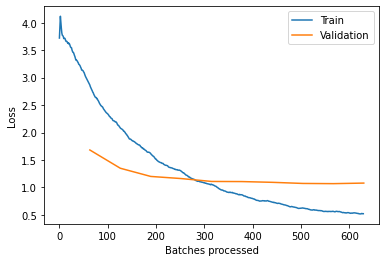

In [0]:
learn.fit_one_cycle(20, min_grad_lr)
learn.save('resnet152-new-20-1')
learn.recorder.plot_losses()

###Предсказываем и смотрим ошибки

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

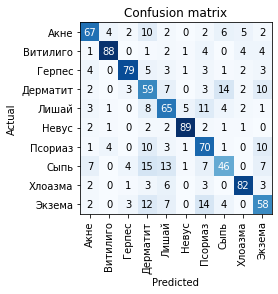

In [0]:
interp.plot_confusion_matrix()

In [0]:
interp.most_confused(min_val=10)

[('Сыпь', 'Дерматит', 15),
 ('Дерматит', 'Сыпь', 14),
 ('Экзема', 'Псориаз', 14),
 ('Сыпь', 'Лишай', 13),
 ('Экзема', 'Дерматит', 12),
 ('Лишай', 'Псориаз', 11),
 ('Акне', 'Дерматит', 10),
 ('Дерматит', 'Экзема', 10),
 ('Псориаз', 'Дерматит', 10),
 ('Псориаз', 'Экзема', 10)]

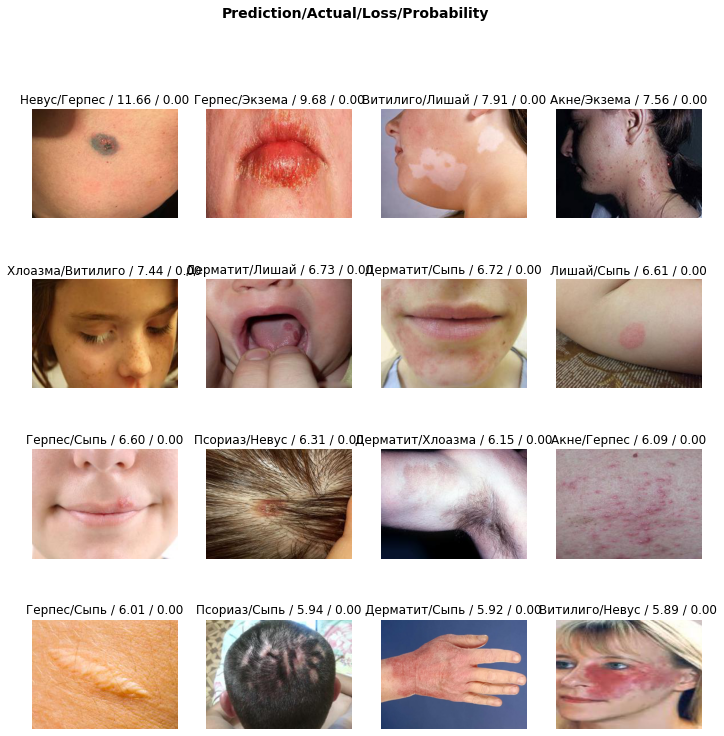

In [0]:
interp.plot_top_losses(16)